In [1]:
import pandas as pd
import numpy as np
import h5py
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter
from IPython import display
plt.style.use('seaborn')
sns.set()

# Spectrum plots, BNP 6/4/21

We did a single transect in a slightly different part of the grasslands at BNP than we had done previously.

The transect starts at the top of the hill (relatively low SOC contents), and runs to the bottom of the hill (relatively high SOC contents).

There were ten "stops along the transect:

- #1 at 0 m
- #2 at 15 m
- #3 at 25 m
- #4 at 30 m
- #5 at 35 m
- #6 at 40 m
- #7 at 45 m
- #8 at 50 m
- #9 at 55 m
- #10 at 60 m

At the bottom of the hill we were inside the very poorly drained lowland, which has very high organic matter content.

At each stop we took at least two insertions within a couple inches of each other.  We usually recalibrated after every other insertion, though in a couple of places where is a third insertion before recalibrating.  Some calibrations only include a single insertion.

On the way back up the hill we took an extra insertion at stop #5 and two extra at stop #1.

At stop #4 the spectrometers suddenly appeared to stop working.  The insertion we did there appeared to not generate any data, which caused an exception that the program did not recover from.  After re-starting the program, the FTIR Engine would not reconnect.  We then re-started the FTIR Engine, after which it connected.  However, the visible light spectrometer at that point gave only a minimal calibration spectrum, with maximum value much, much lower than expected.  We restarted both spectrometers and tried again, after which the spectrometers appeared to be functioning normally.

In [2]:
def get_calibration_temperature(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal_temp = h5_file[calibration_path].attrs['ftir_temperature']
        return cal_temp

def get_insertion_temperature(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_temp = h5_file[insertion_path].attrs['ftir_temp']
        return ins_temp

def get_visible_white_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['white_spectrum'][:]
        return cal

def get_ftir_white_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['white_spectrum2'][:]
        return cal

def get_visible_wavelength_vector(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        waves = h5_file[calibration_path].attrs['spec1_wavelengths_vector'][:]
        return waves

def get_ftir_wavelength_vector(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        waves = h5_file[calibration_path].attrs['spec2_wavelengths_vector'][:]
        return waves

def get_ftir_insertion_absorbances(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_abs = h5_file[f'{insertion_path}/spectrometer2/derived/absorbances'][:]
        return ins_abs

def get_ftir_insertion_raw_spectra(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_raw = h5_file[f'{insertion_path}/spectrometer2/spectra'][:]
        return ins_raw

def get_ftir_insertion_timestamps(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        timestamps = h5_file[f'{insertion_path}/spectrometer2/timestamps'][:]
        return timestamps

def get_visible_insertion_timestamps(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        timestamps = h5_file[f'{insertion_path}/spectrometer1/timestamps'][:]
        return timestamps

def get_visible_insertion_absorbances(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_abs = h5_file[f'{insertion_path}/spectrometer1/derived/absorbances'][:]
        return ins_abs

def get_visible_insertion_raw_spectra(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_raw = h5_file[f'{insertion_path}/spectrometer1/spectra'][:]
        return ins_raw

def create_list_of_items_in_node(item_type, file, node):
    with h5py.File(file, 'r') as h5_file:
        keys = []
        if item_type == "group":
            my_type = h5py._hl.group.Group
        if item_type == "dataset":
            my_type = h5py._hl.dataset.Dataset
        h5_file[node].visit(lambda key: keys.append(key) if type(h5_file[node][key]) is my_type else None)
        return keys

def create_list_of_calibrations_in_node(file, node):
    calibrations = []
    all_groups = create_list_of_items_in_node("group", file, node)
    for group in all_groups:
        if group[-6:-3] == 'cal':
            calibrations.append(node + '/' + group)
    return calibrations

def create_list_of_insertions_in_calibration(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        insertion_keys = list(h5_file[calibration_path].keys())
        insertions = [f'{calibration_path}/{key}' for key in insertion_keys]
        return insertions

def select_by_depth_range(df, range_start, range_end):
    df_out = df.loc[(df['depth'] > range_start) & (df['depth'] < range_end)]
    return df_out

def calculate_absorbance_from_raw(raw_spectrum, white_spectrum, dark_spectrum):
    reflectance = ((raw_spectrum - dark_spectrum) / (white_spectrum - dark_spectrum))
    inverse_reflectance = 1/reflectance
    absorbance = np.log10(inverse_reflectance.astype(np.float64))
    return absorbance

def calculate_absorbance_for_2D_array(array, white_spectrum, dark_spectrum):
    absorbance_array = np.empty_like(array, dtype=np.float64)
    for i in range(array.shape[0]):
        absorbance_spectrum = calculate_absorbance_from_raw(array[i, :], white_spectrum, dark_spectrum)
        absorbance_array[i, :] = absorbance_spectrum
    return absorbance_array

def construct_full_file_path(data_path, file_name):
    file_path = data_path + file_name
    return file_path

def create_list_of_sessions_in_file(file_name):
    sessions = []
    all_groups = create_list_of_items_in_node("group", file_name, "/")
    for group in all_groups:
        if (group[0:3] == 'ses') and (len(group) == 10):
            sessions.append(group)
    return sessions

def create_list_of_insertions_in_file(file_name):
    insertions = []
    sessions = create_list_of_sessions_in_file(file_name)
    for session in sessions:
        calibrations = create_list_of_calibrations_in_node(file_name, session)
        for calibration in calibrations:
            cal_insertions = create_list_of_insertions_in_calibration(file_name, calibration)
            for insertion in cal_insertions:
                insertions.append(insertion)
    return insertions

def get_insertion_timestamp(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_time = h5_file[insertion_path].attrs['start_time']
        ins_timestamp = pd.Timestamp(ins_time, unit='us')
        return ins_timestamp

def get_calibration_timestamp(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal_time = h5_file[calibration_path].attrs['calibration_start_time']
        cal_timestamp = pd.Timestamp(cal_time, unit='us')
        return cal_timestamp

def find_position_in_wavelength_vector(wavelength_vector, integer):
    position = np.where(np.isclose(wavelength_vector, integer, 1e-3))[0][0]
    return position

def normalize(value, max_value, min_value):
    normalized_value = (value - min_value)/(max_value - min_value)
    return normalized_value

def get_ftir_dark_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['dark_spectrum2'][:]
        return cal

def get_visible_dark_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['dark_spectrum'][:]
        return cal

def get_ftir_spectrum_timestamp(file, insertion_path, index):
    with h5py.File(file, 'r') as h5_file:
        time = h5_file[f'{insertion_path}/spectrometer2/timestamps'][index]
        timestamp = pd.Timestamp(time, unit='us')
        return timestamp

def get_visible_spectrum_timestamp(file, insertion_path, index):
    with h5py.File(file, 'r') as h5_file:
        time = h5_file[f'{insertion_path}/spectrometer1/timestamps'][index]
        timestamp = pd.Timestamp(time, unit='us')
        return timestamp

def compute_3D_distance(x1, y1, z1, x2, y2, z2):
    distance = math.sqrt((x1 - x2)**2 + (y1 - y2)**2 + (z1 - z2)**2)
    return distance

def calculate_wavenumbers_from_wavelengths(wavelength_vector):
    return 10000000/wavelength_vector

def put_spectrum_in_wavenum_order(spectrum):
    return np.flip(spectrum)

def normalize_depth(depth, depth_min, depth_max):
    return (depth - depth_min) / (depth_max - depth_min)


In [3]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
green_list_df = pd.read_csv('data/Green_misc_insertions_210604.csv')
date = '6/4/21'
bath_df = green_list_df.loc[green_list_df['date'] == date]

# Plots of visible spectrometer spectra by depth

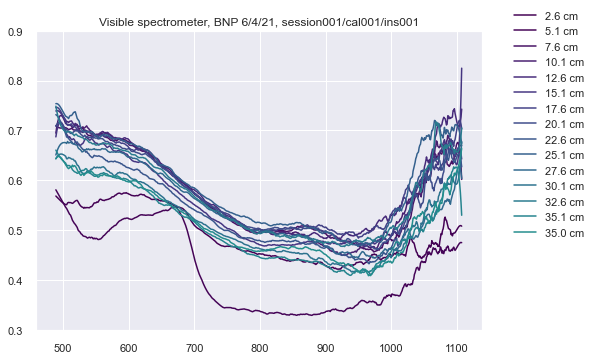

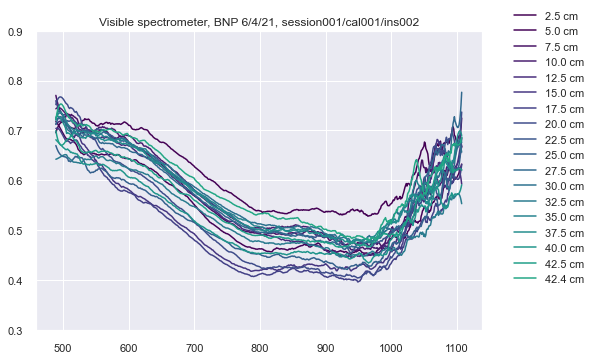

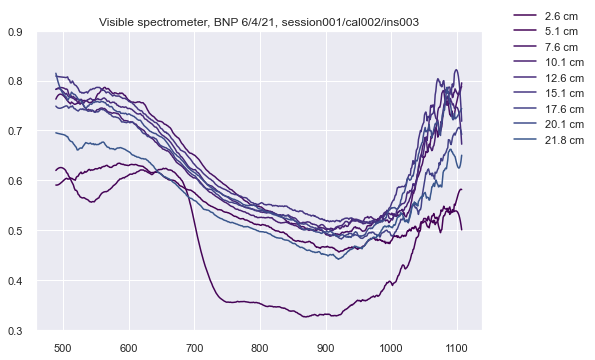

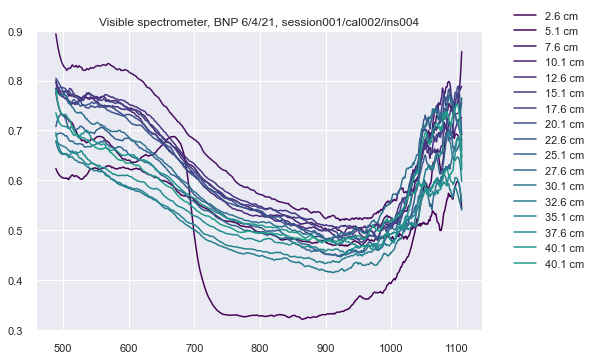

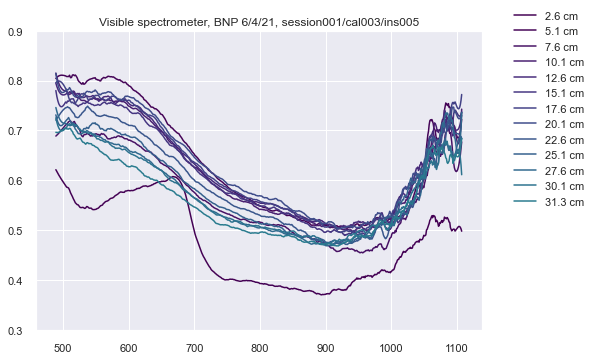

...

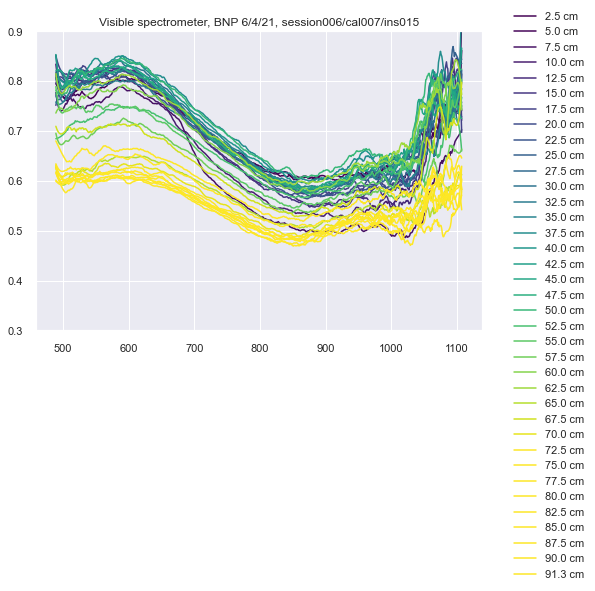

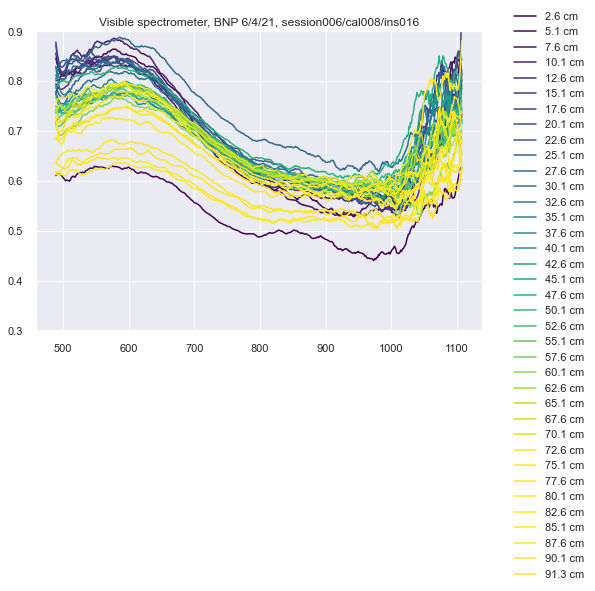

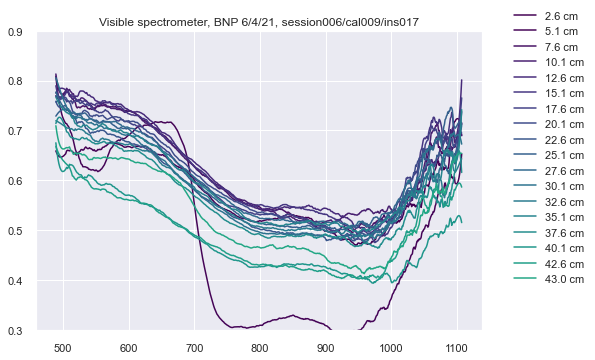

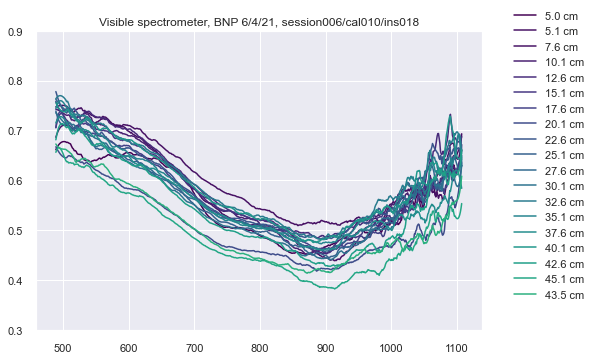

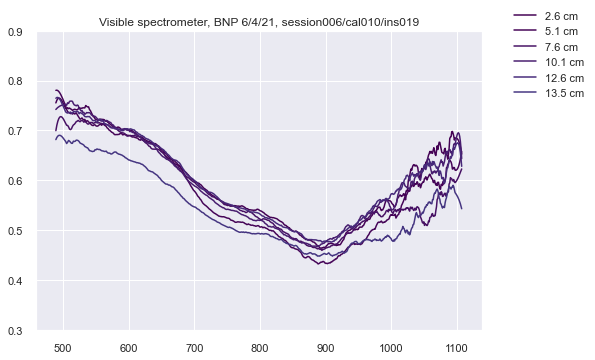

In [4]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
file_name = bath_df.iat[0, 0]
file = path_name + file_name

for index in bath_df.index.values:
    session = bath_df['session'][index]
    calibration = bath_df['calibration'][index]
    insertion = bath_df['insertion'][index]
    cal_path = f'{session}/{calibration}'
    with h5py.File(file, 'r') as h5_file:
        absorbance_depths = h5_file[f'{session}/{calibration}/{insertion}/derived/absorbance_depth'][:]
    waves = get_visible_wavelength_vector(file, cal_path)
    absorbances = absorbance_depths[:, :512]
    depths = absorbance_depths[:, -1]
    absorbances_no_surface = absorbances[depths > 2.0]
    depths_no_surface = depths[depths > 2.0]
    depth_min = 2.0
    depth_max = 70.0

    fig, ax = plt.subplots()
    ax.set_title(f"Visible spectrometer, BNP {date}, {cal_path}/{insertion}")
    ax.set_ylim(0.3, 0.9)
    for i in range(absorbances_no_surface.shape[0]):
        color = plt.cm.viridis(normalize_depth(depths[i], depth_min, depth_max))
        ax.plot(waves, savgol_filter(absorbances_no_surface[i, :], 21, 3), color=color, label=f'{depths_no_surface[i]:0.1f} cm')
    plt.legend(bbox_to_anchor=(1.05, 0.9, 0.3, 0.2), loc='upper left')
    plt.show()
    plt.close()

# Plots of FTIR Engine spectra by depth

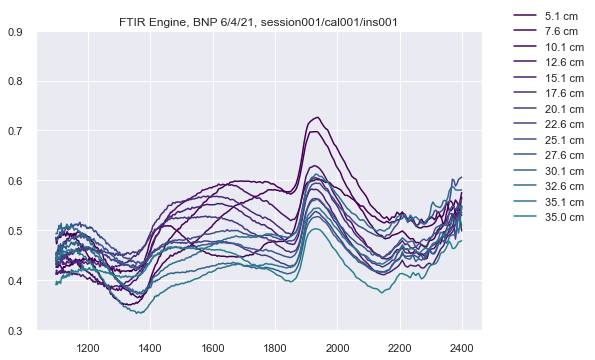

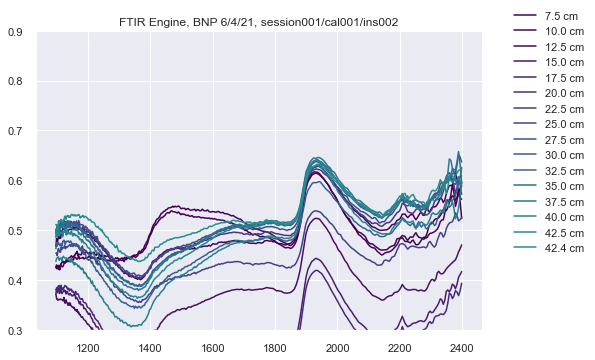

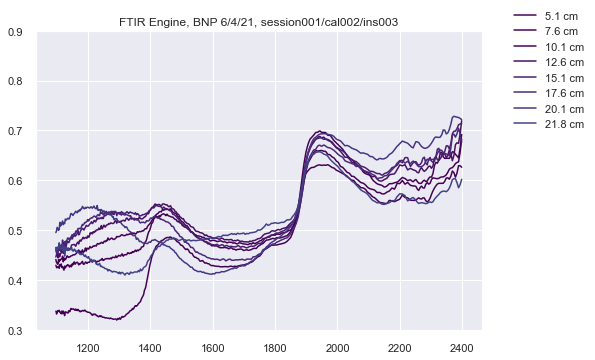

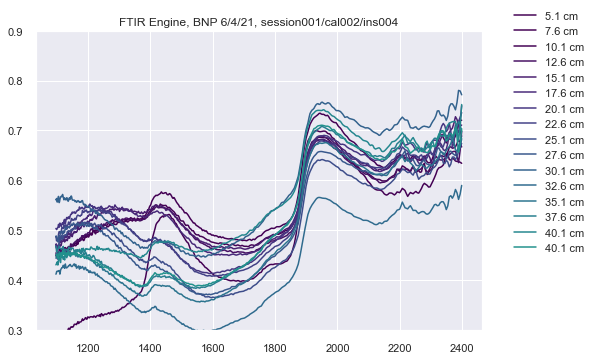

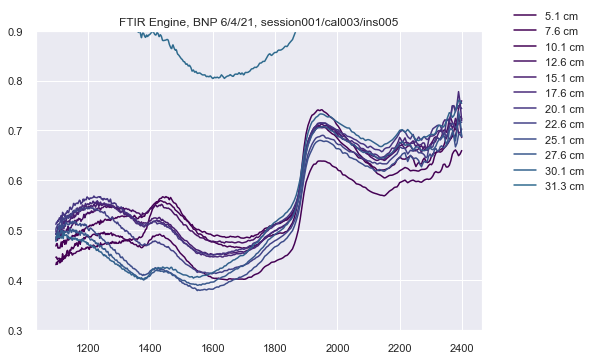

...

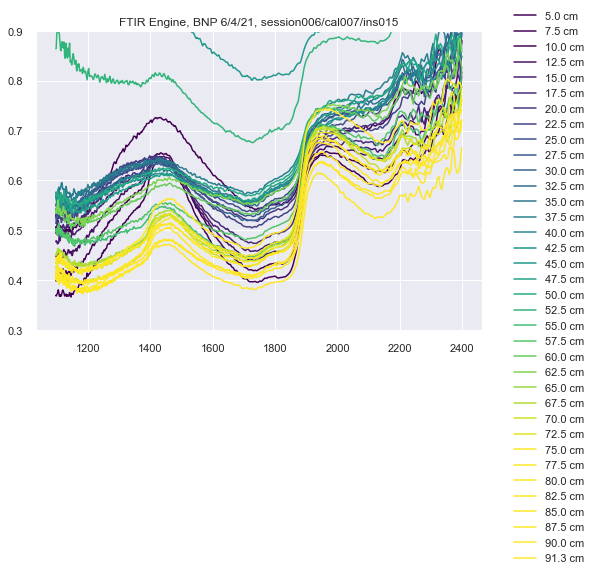

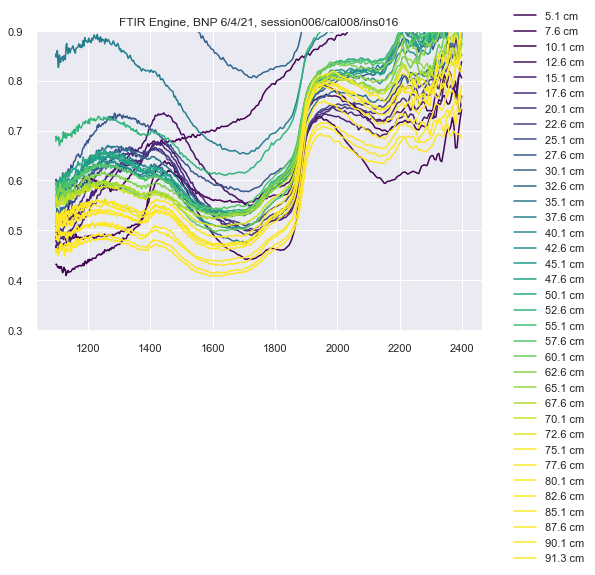

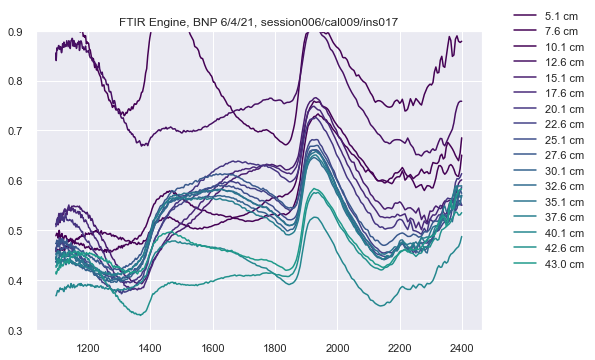

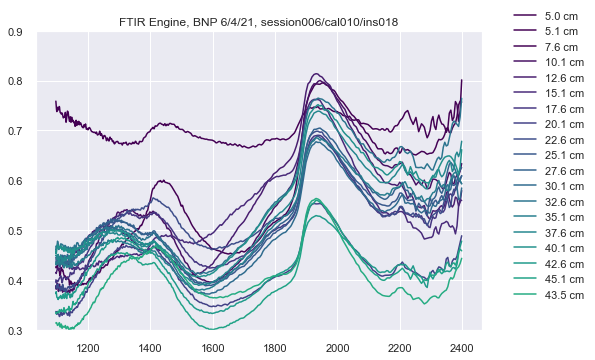

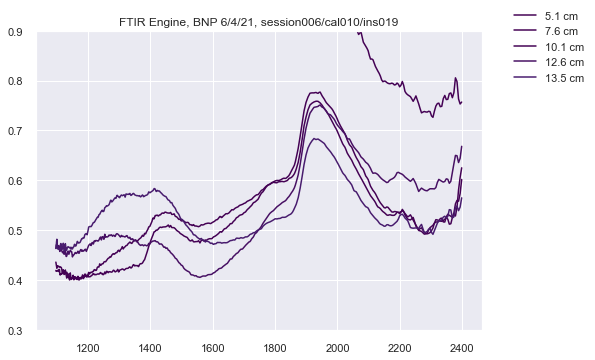

In [5]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
file_name = bath_df.iat[0, 0]
file = path_name + file_name
depth_min = 5.0
depth_max = 70.0
waves_min_index = 100
waves_max_index = 665

for index in bath_df.index.values:
    session = bath_df['session'][index]
    calibration = bath_df['calibration'][index]
    insertion = bath_df['insertion'][index]
    cal_path = f'{session}/{calibration}'
    with h5py.File(file, 'r') as h5_file:
        absorbance_depths = h5_file[f'{session}/{calibration}/{insertion}/derived/absorbance_depth'][:]
    waves = get_ftir_wavelength_vector(file, cal_path)
    waves = waves[waves_min_index:waves_max_index]
    absorbances = absorbance_depths[:, 512:-2]
    depths = absorbance_depths[:, -1]
    absorbances_no_surface = absorbances[depths > depth_min]
    depths_no_surface = depths[depths > depth_min]
    absorbances_no_surface = absorbances_no_surface[:, waves_min_index:waves_max_index]

    fig, ax = plt.subplots()
    ax.set_ylim(0.3, 0.9)
    ax.set_title(f"FTIR Engine, BNP {date}, {cal_path}/{insertion}")
    for i in range(absorbances_no_surface.shape[0]):
        color = plt.cm.viridis(normalize_depth(depths[i], depth_min, depth_max))
        ax.plot(waves,
                absorbances_no_surface[i, :],
                color=color, label=f'{depths_no_surface[i]:0.1f} cm')
    plt.legend(bbox_to_anchor=(1.05, 0.9, 0.3, 0.2), loc='upper left')
    plt.show()
    plt.close()

Plots of FTIR Engine spectra by stop by depth

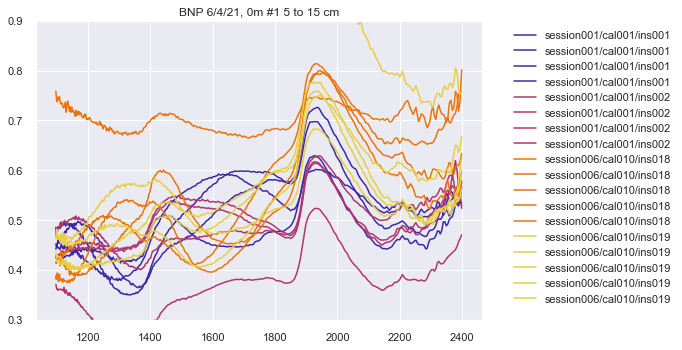

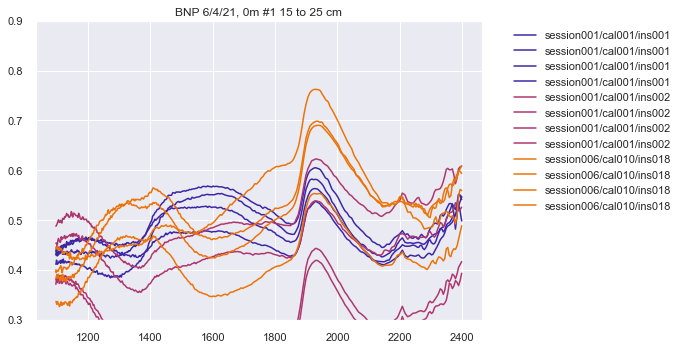

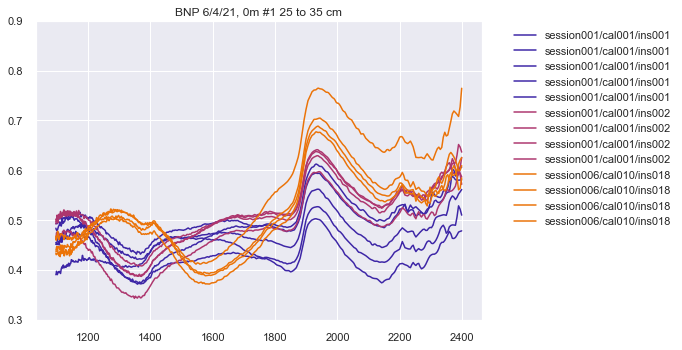

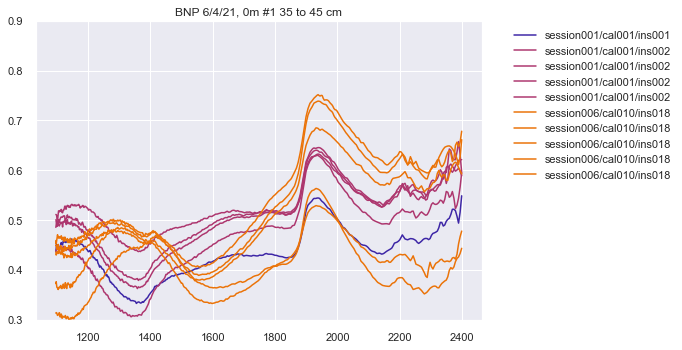

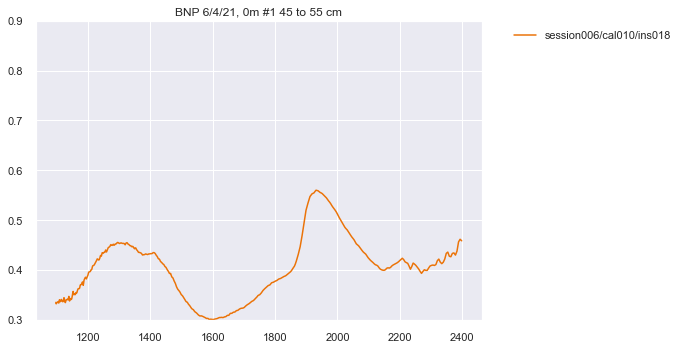

No handles with labels found to put in legend.


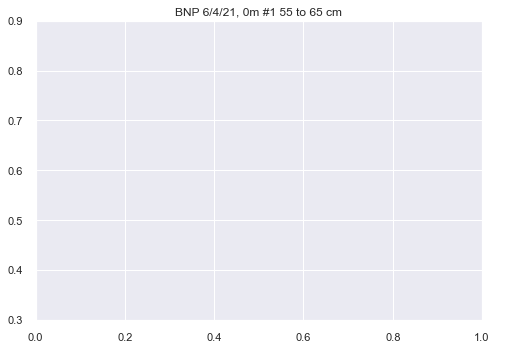

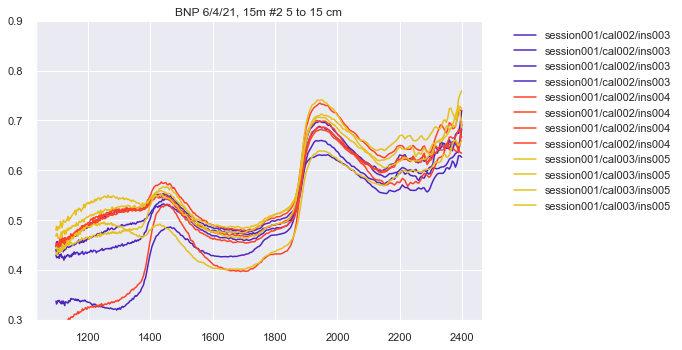

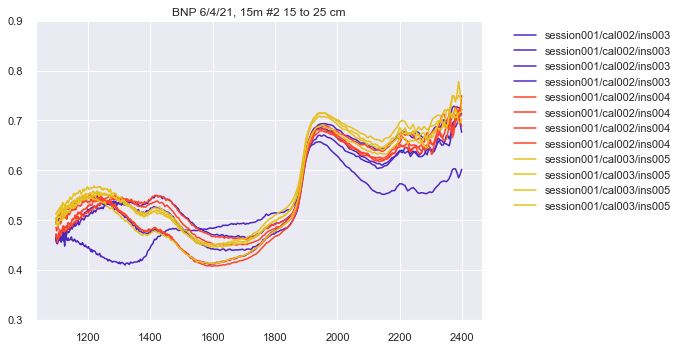

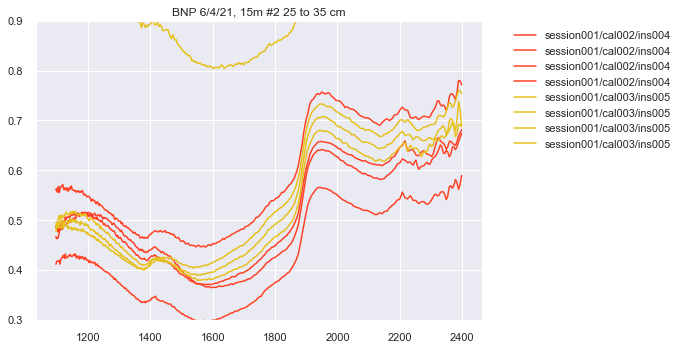

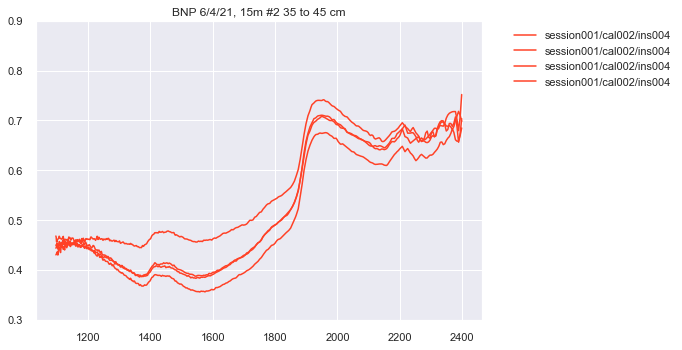

No handles with labels found to put in legend.


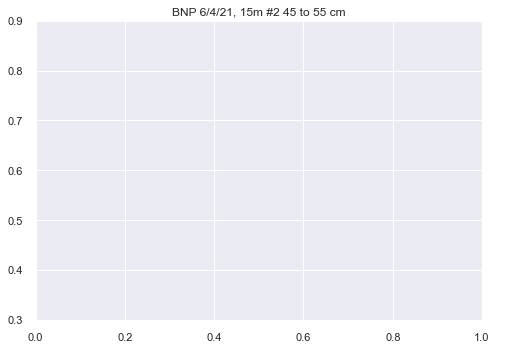

No handles with labels found to put in legend.


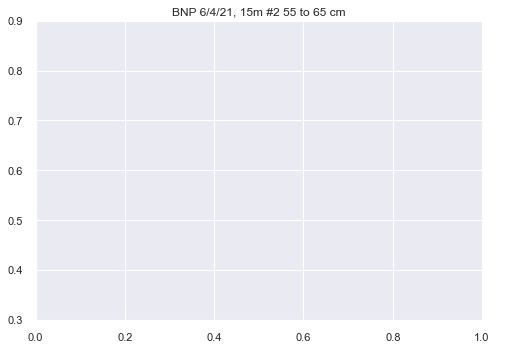

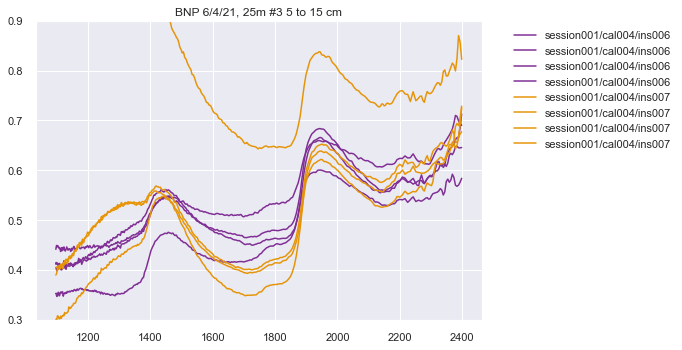

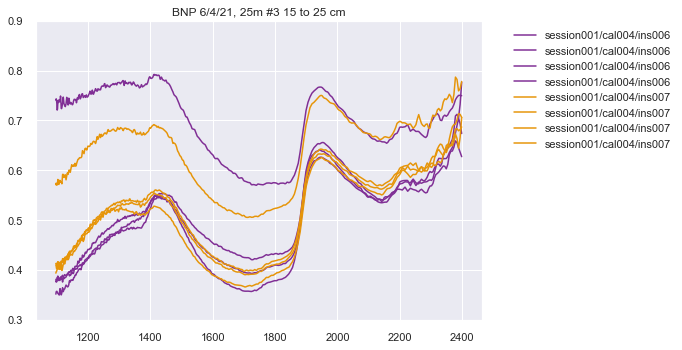

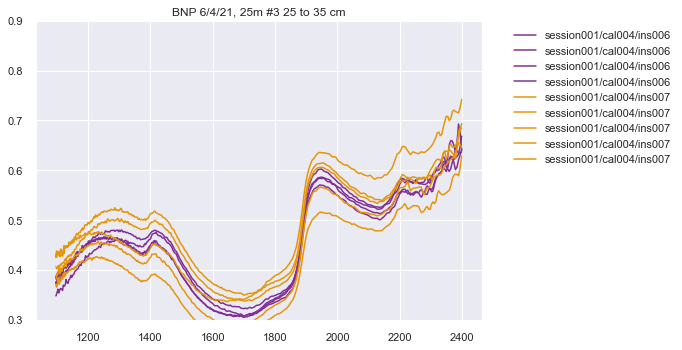

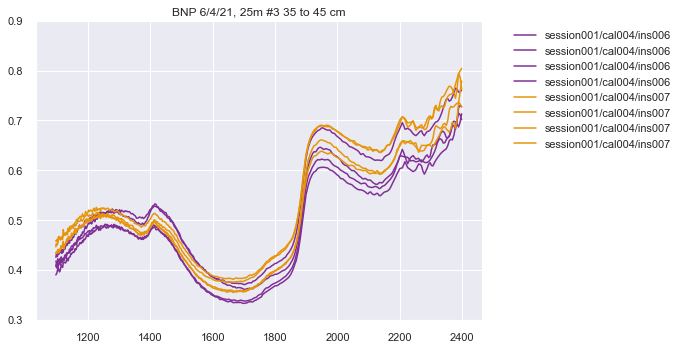

...

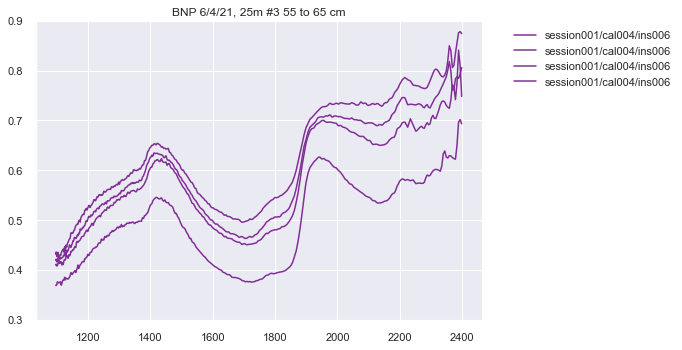

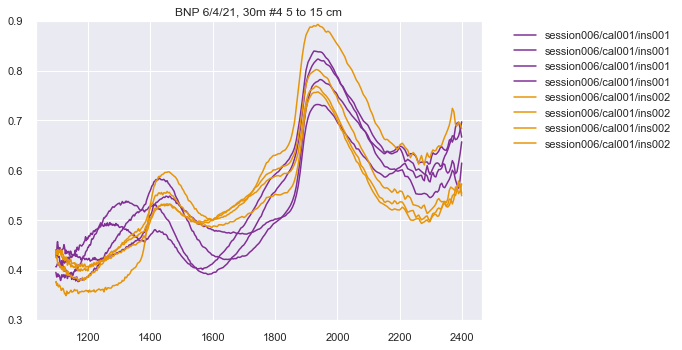

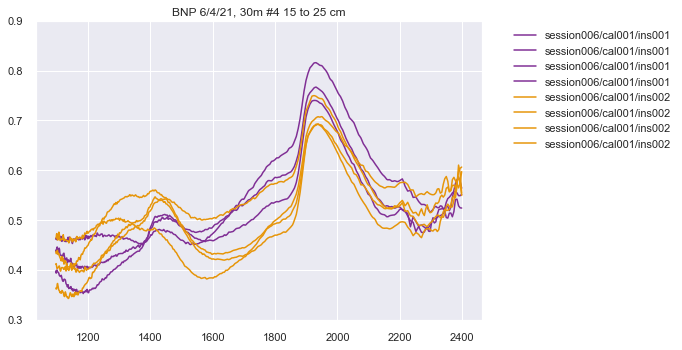

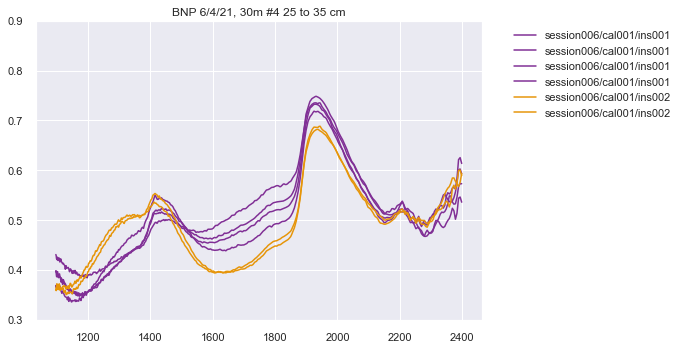

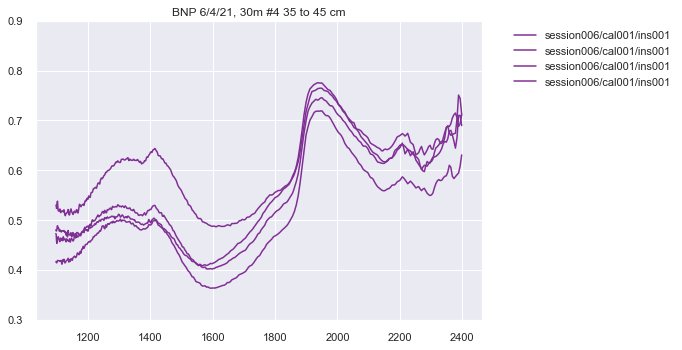

No handles with labels found to put in legend.


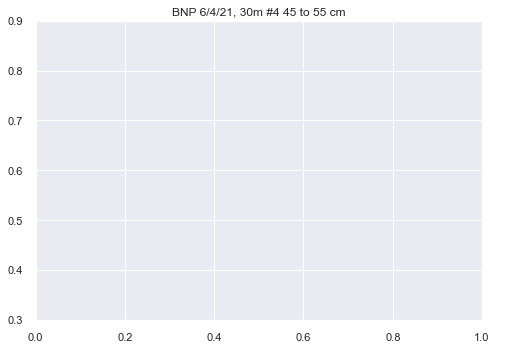

No handles with labels found to put in legend.


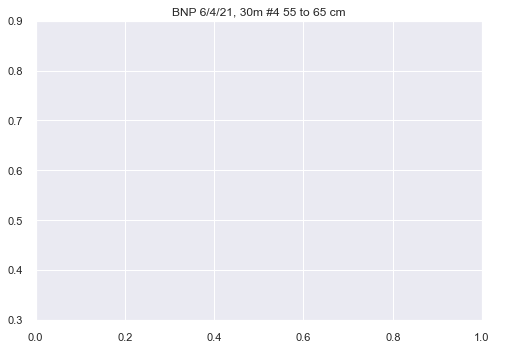

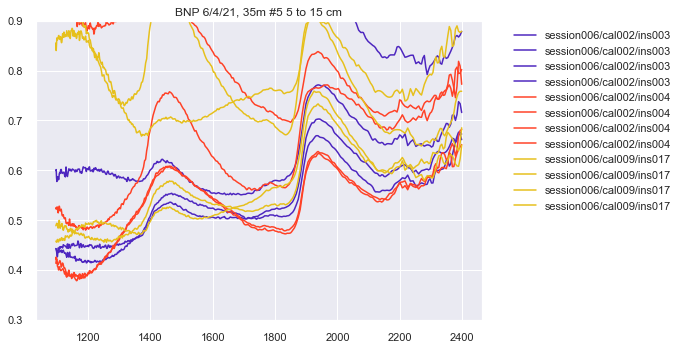

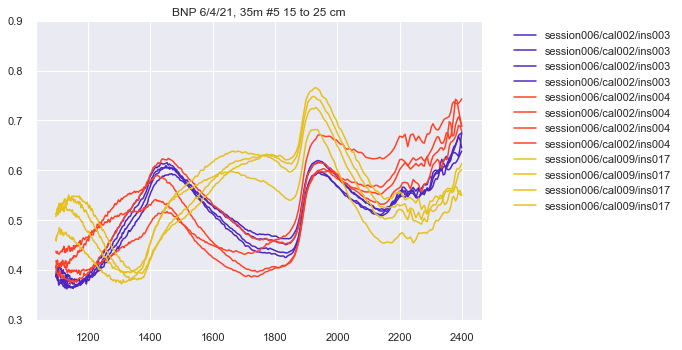

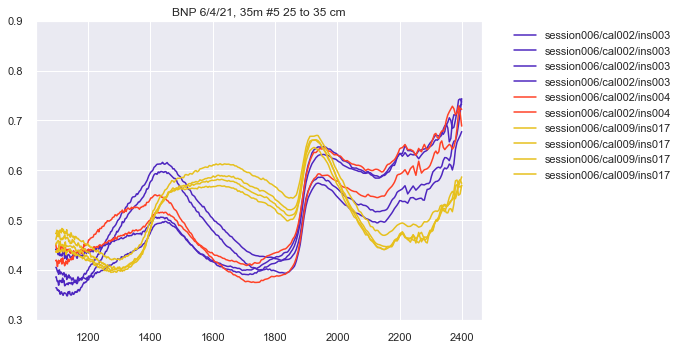

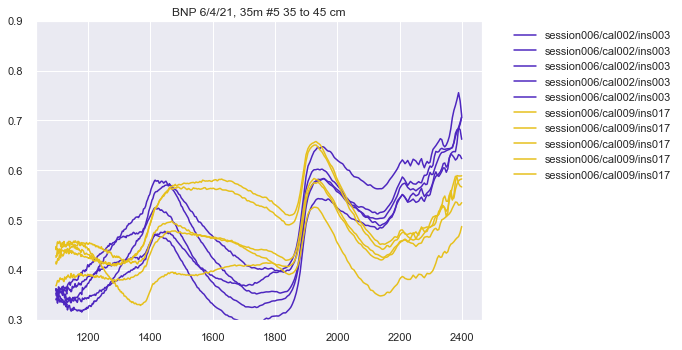

No handles with labels found to put in legend.


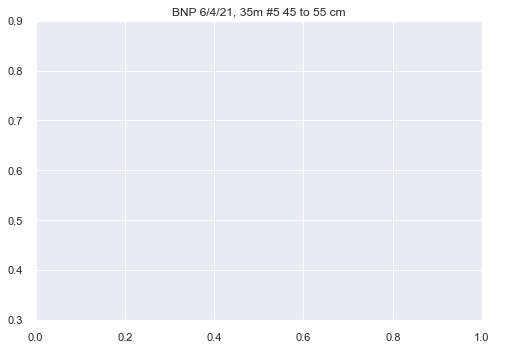

No handles with labels found to put in legend.


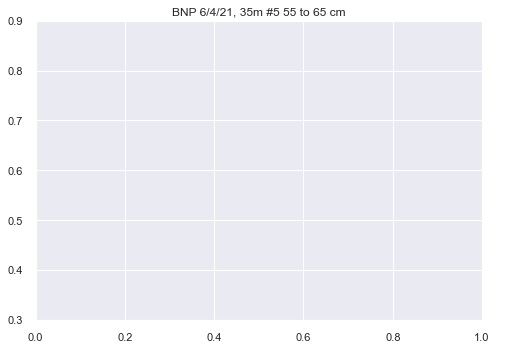

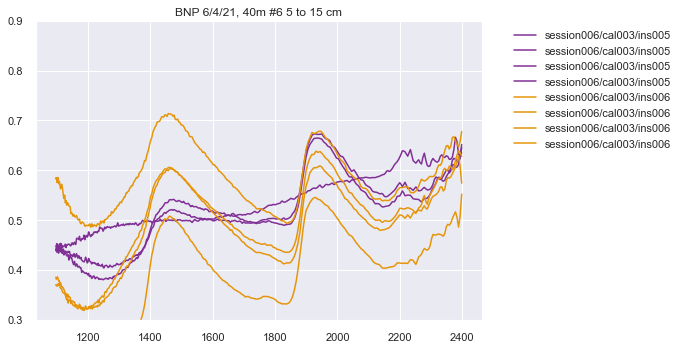

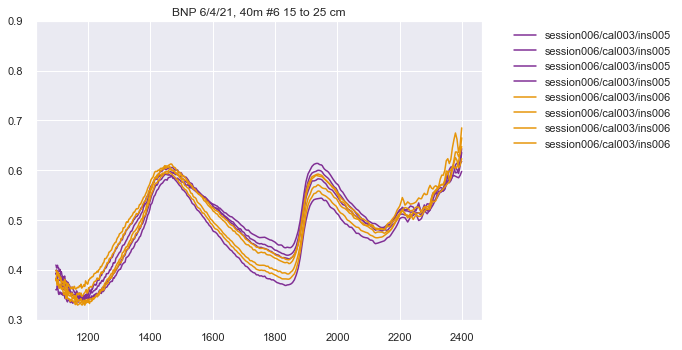

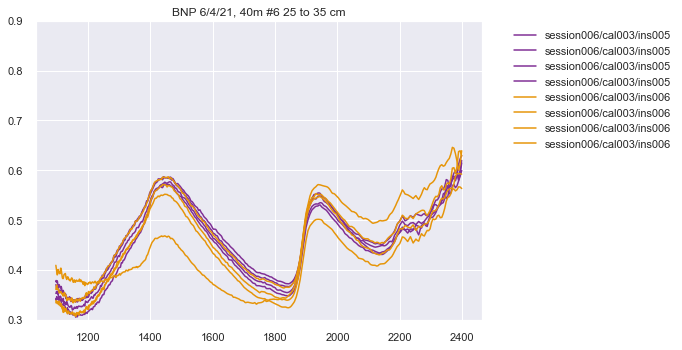

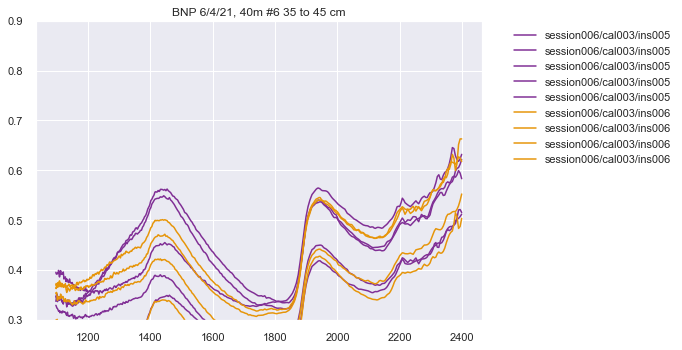

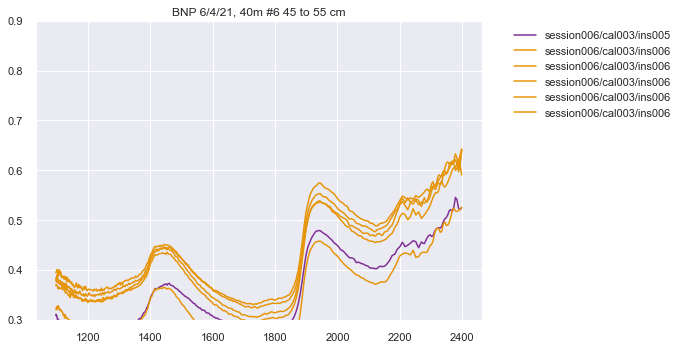

No handles with labels found to put in legend.


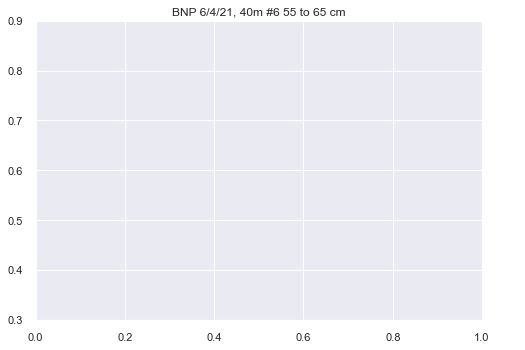

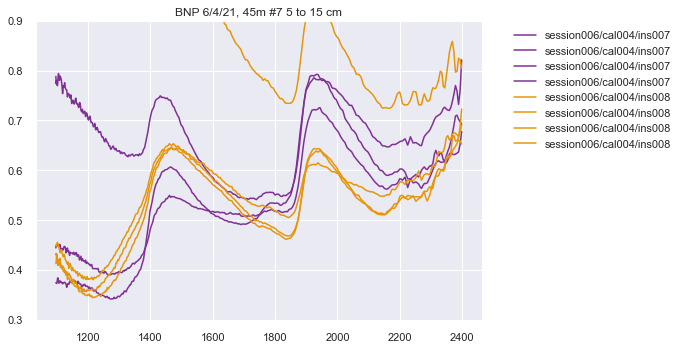

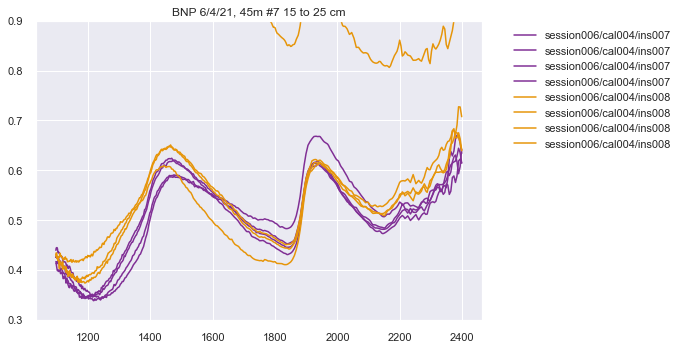

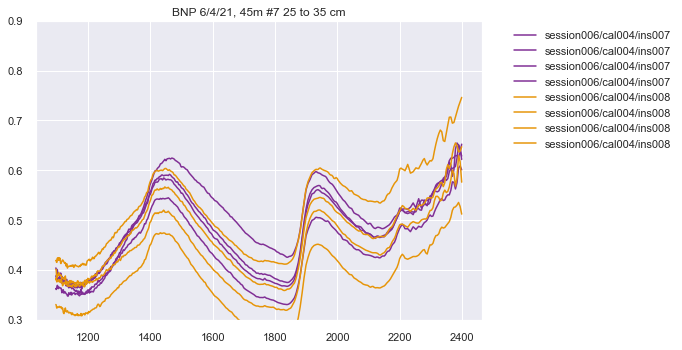

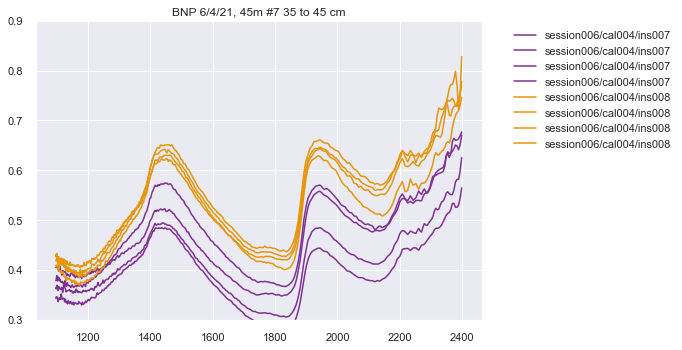

...

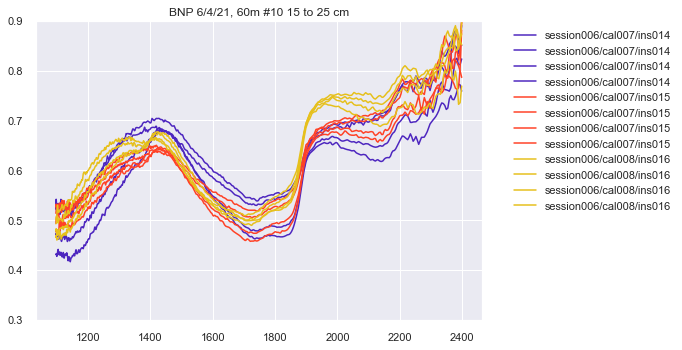

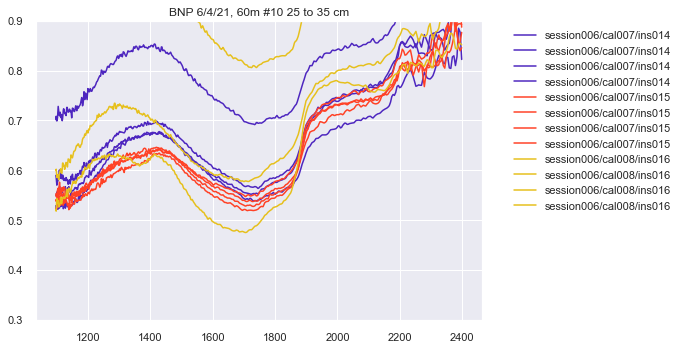

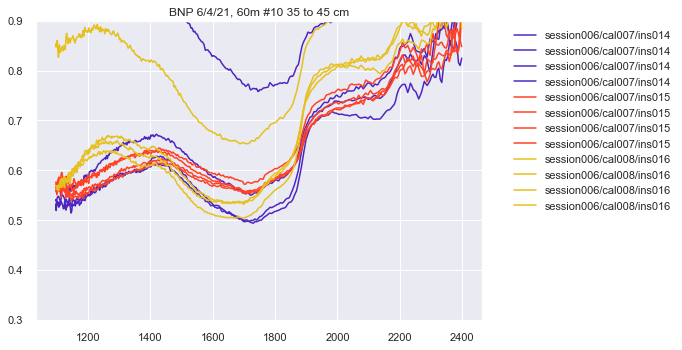

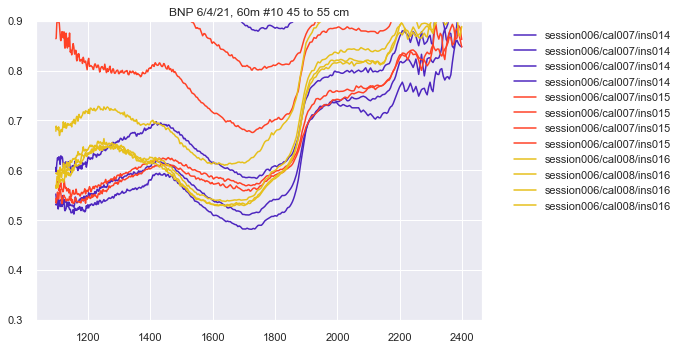

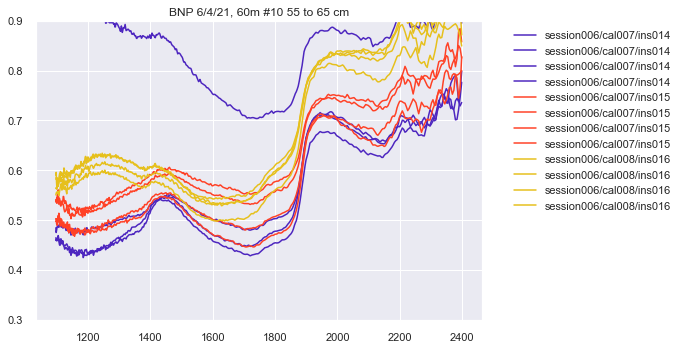

In [6]:
conditions = bath_df['target'].unique()
for condition in conditions:
    for depth in range(5, 60, 10):

        t1 = bath_df.loc[bath_df['target'] == condition]

        unique_insertions = t1['insertion'].unique()
        rgb_values = sns.color_palette("CMRmap", unique_insertions.shape[0])
        color_map = dict(zip(unique_insertions, rgb_values))

        path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
        file_name = bath_df.iat[0, 0]
        file = path_name + file_name
        depth_min = depth
        depth_max = depth + 10
        waves_min_index = 100
        waves_max_index = 665

        fig, ax = plt.subplots()
        ax.set_ylim(0.3, 0.9)
        ax.set_title(f"BNP {date}, {condition} {depth_min} to {depth_max} cm")


        for index in t1.index.values:
            session = bath_df['session'][index]
            calibration = bath_df['calibration'][index]
            insertion = bath_df['insertion'][index]
            cal_path = f'{session}/{calibration}'
            with h5py.File(file, 'r') as h5_file:
                absorbance_depths = h5_file[f'{session}/{calibration}/{insertion}/derived/absorbance_depth'][:]
            waves = get_ftir_wavelength_vector(file, cal_path)
            waves = waves[waves_min_index:waves_max_index]
            absorbances = absorbance_depths[:, 512:-2]
            depths = absorbance_depths[:, -1]
            absorbances_no_surface = absorbances[(depths > depth_min) & (depths < depth_max)]
            depths_no_surface = depths[(depths > depth_min) & (depths < depth_max)]
            absorbances_no_surface = absorbances_no_surface[:, waves_min_index:waves_max_index]

            for i in range(absorbances_no_surface.shape[0]):
                color = color_map[insertion]
                ax.plot(waves,
                        absorbances_no_surface[i, :],
                        color=color, label=f'{session}/{calibration}/{insertion}')
        plt.legend(bbox_to_anchor=(1.05, 0.8, 0.3, 0.2), loc='upper left')

        plt.show()
        plt.close()

# Plots of visible spectrometer spectra by stop by depth

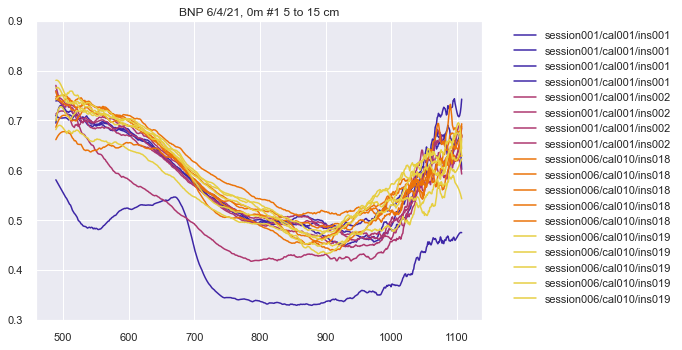

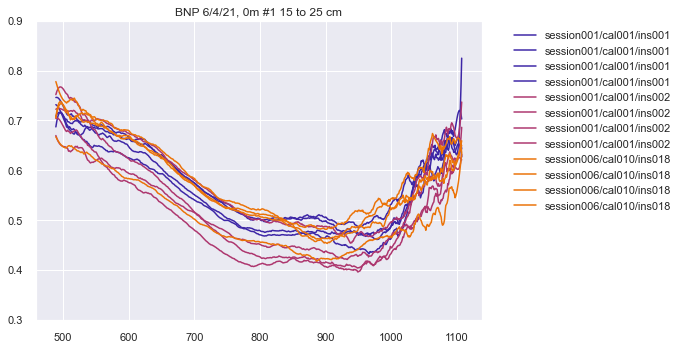

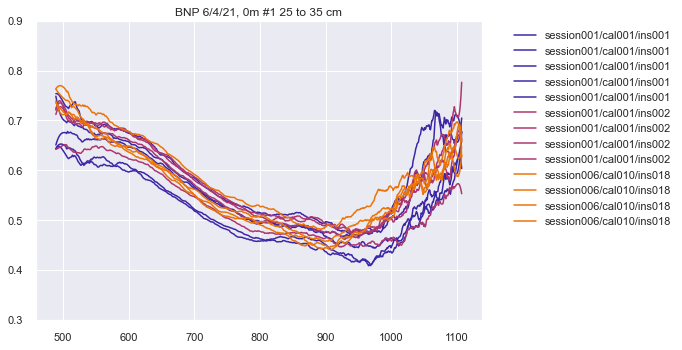

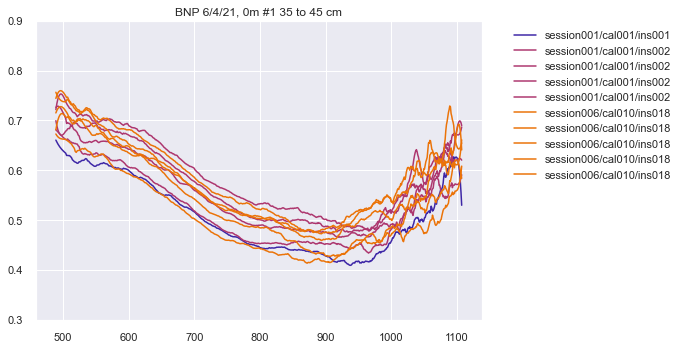

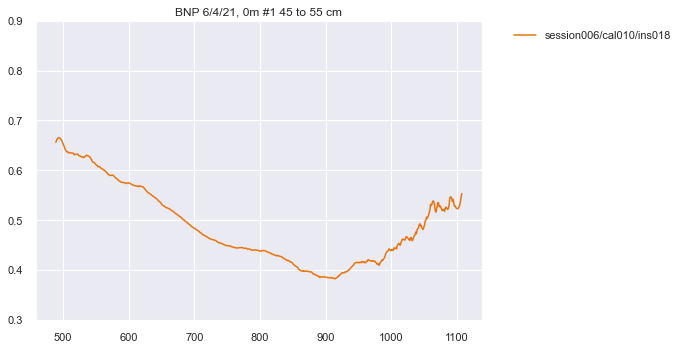

No handles with labels found to put in legend.


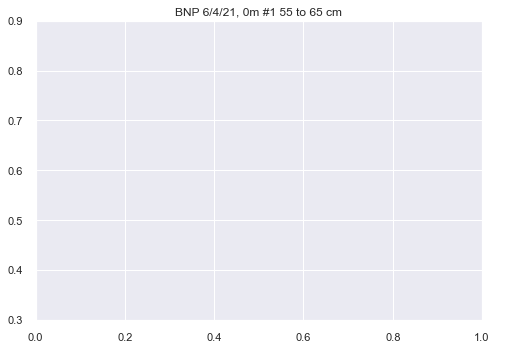

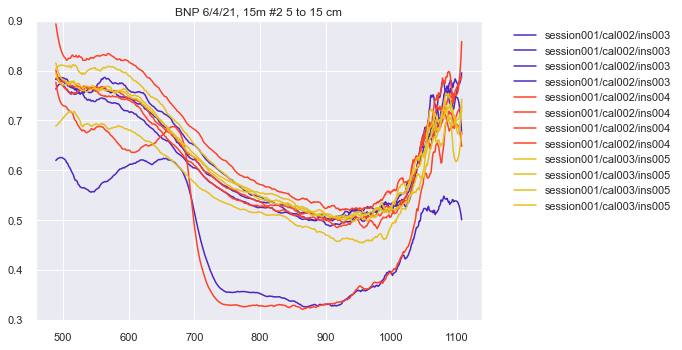

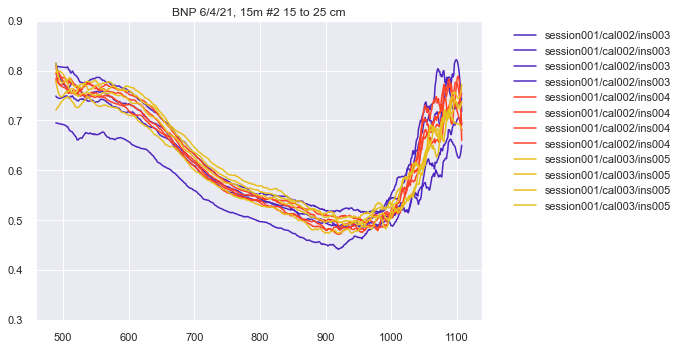

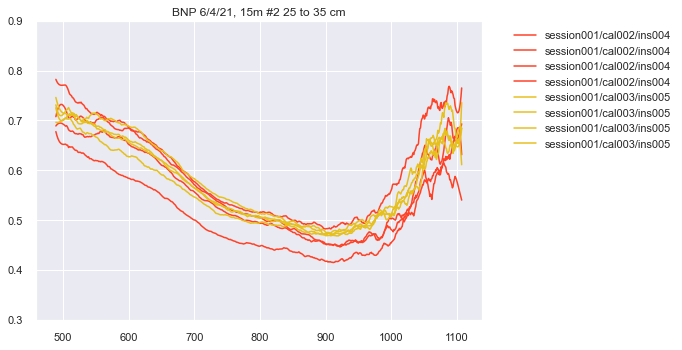

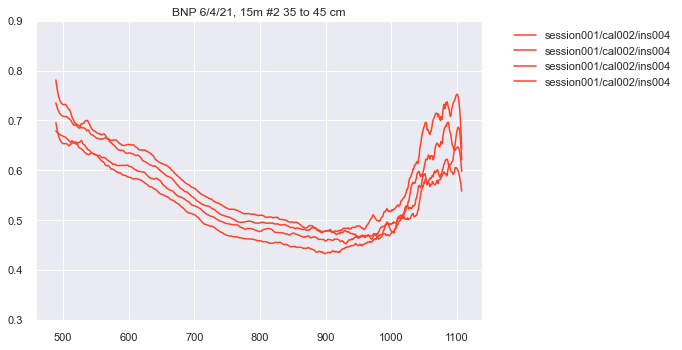

No handles with labels found to put in legend.


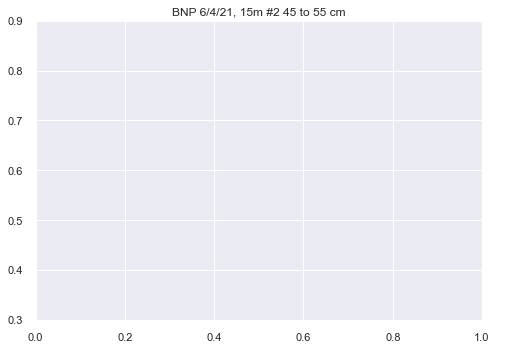

No handles with labels found to put in legend.


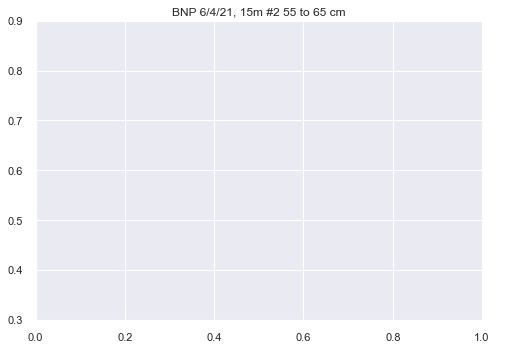

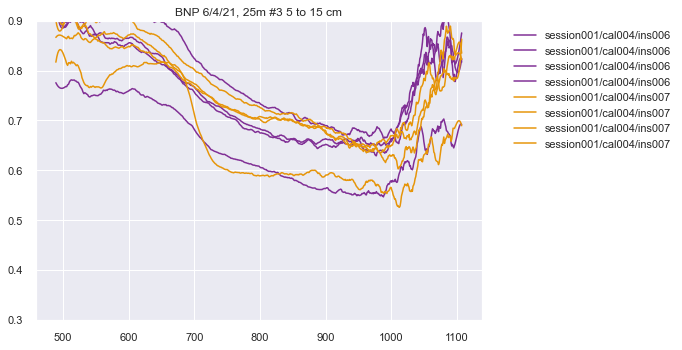

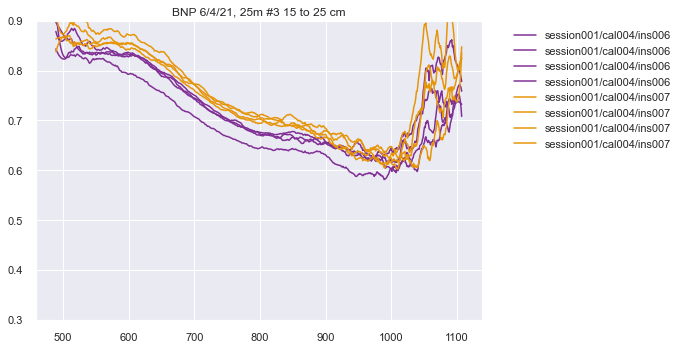

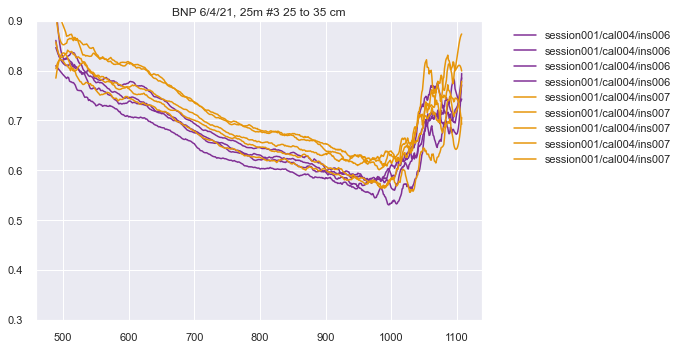

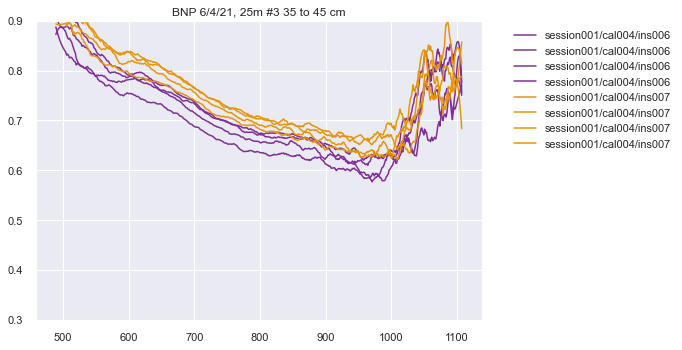

...

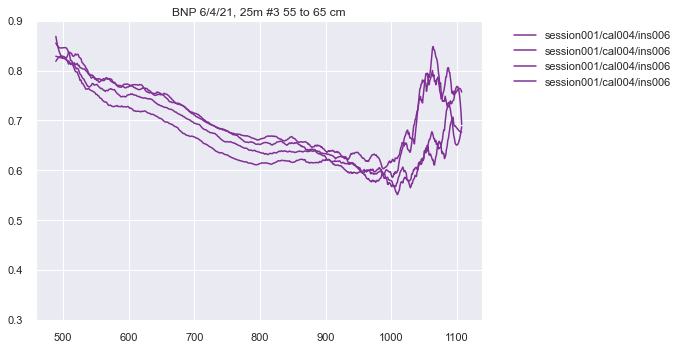

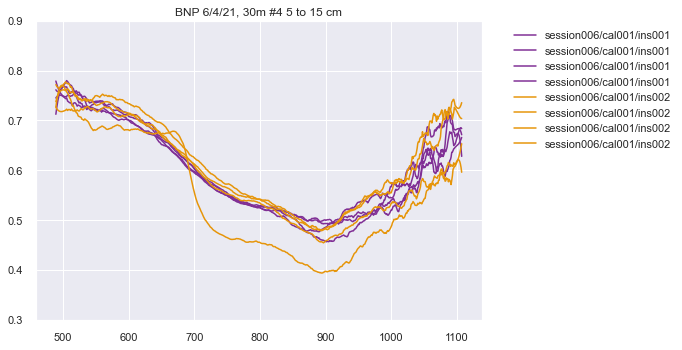

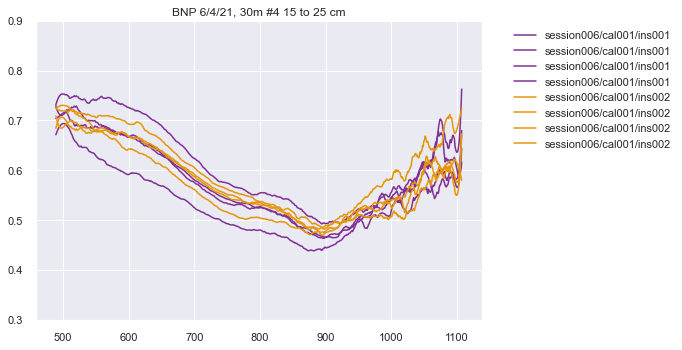

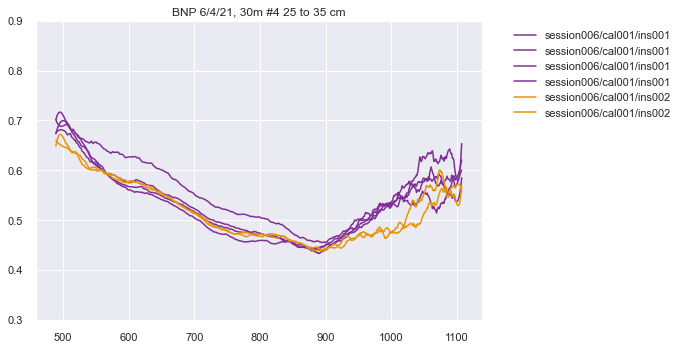

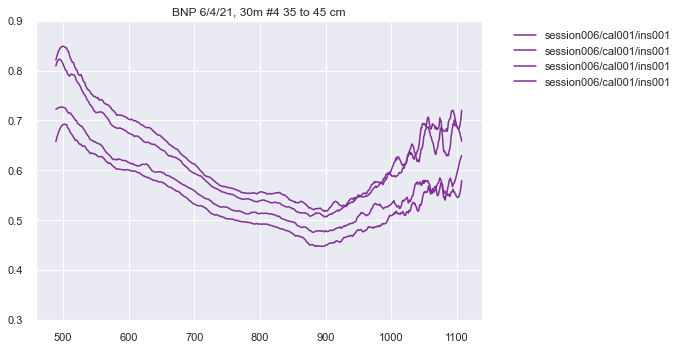

No handles with labels found to put in legend.


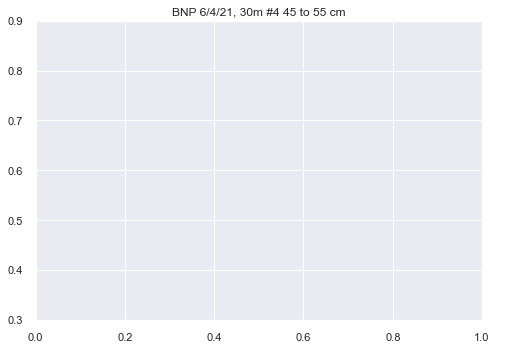

No handles with labels found to put in legend.


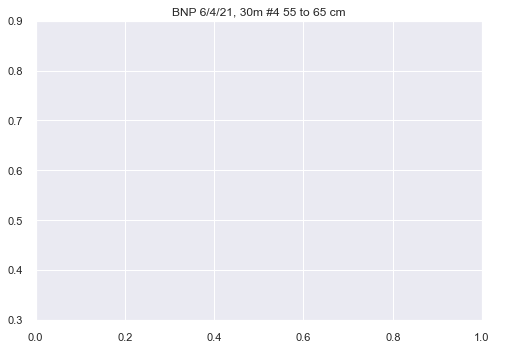

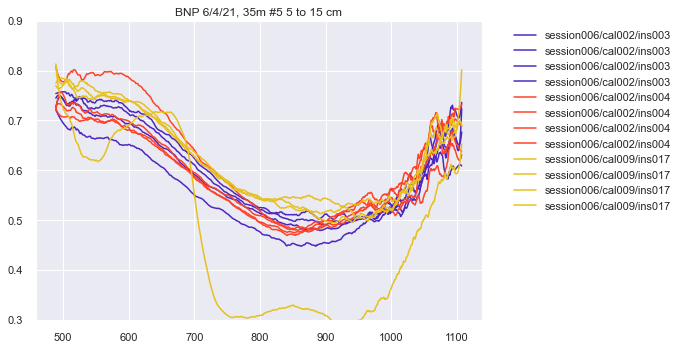

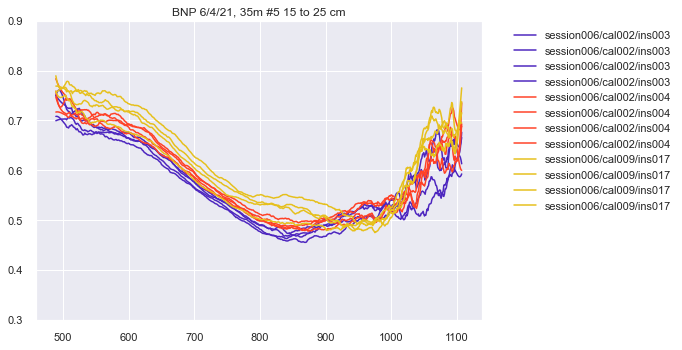

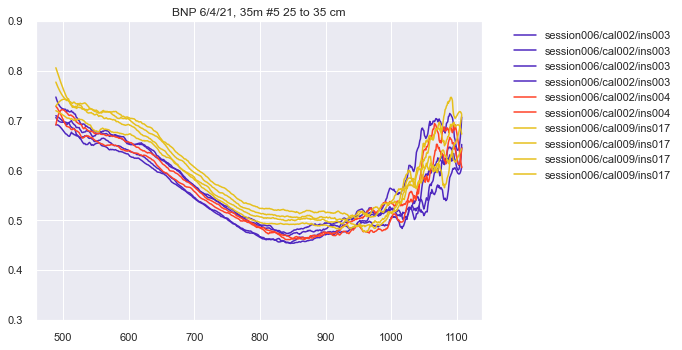

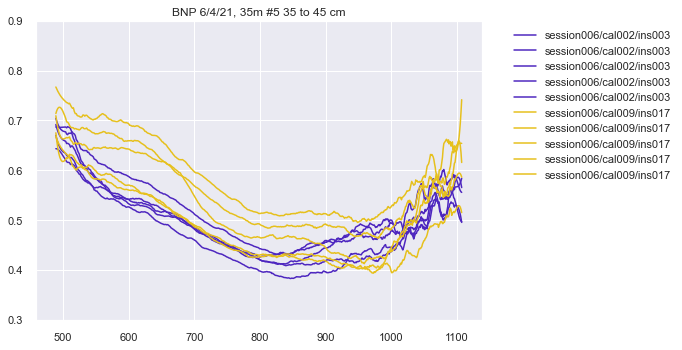

No handles with labels found to put in legend.


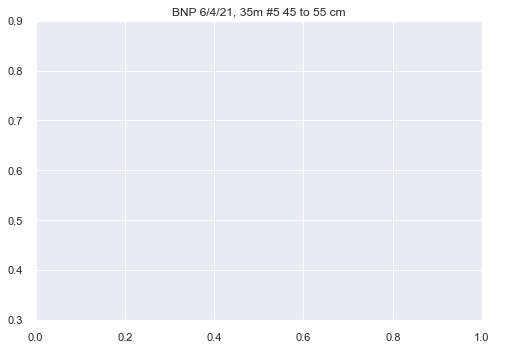

No handles with labels found to put in legend.


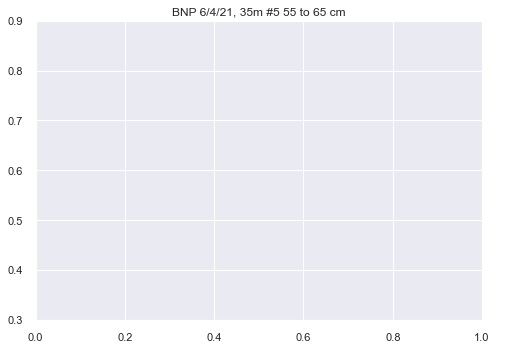

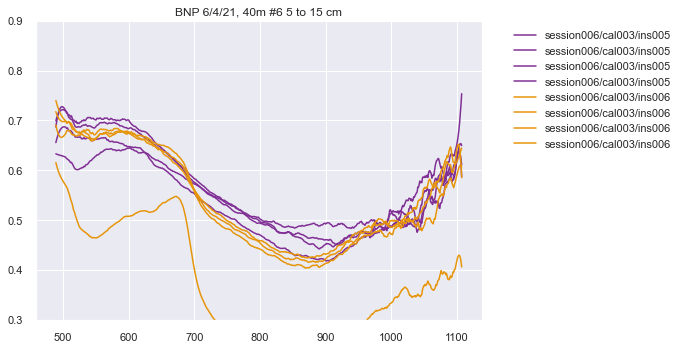

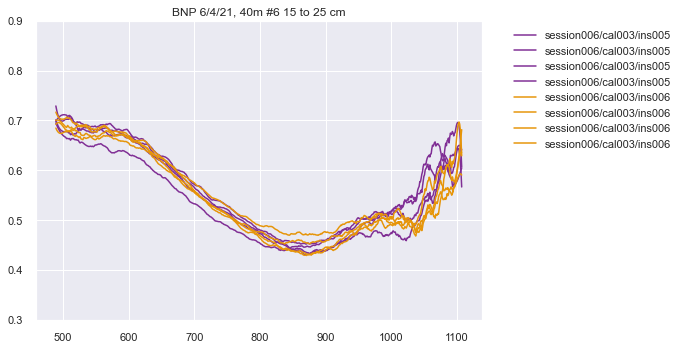

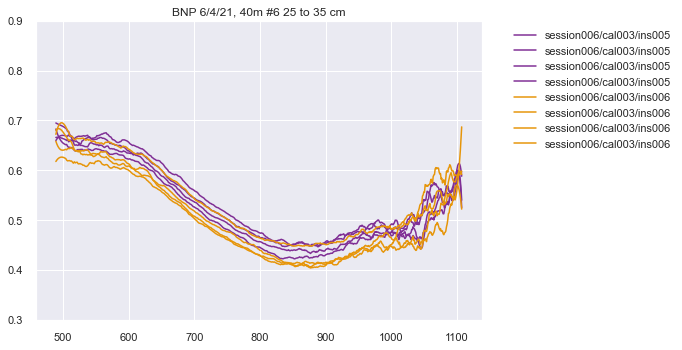

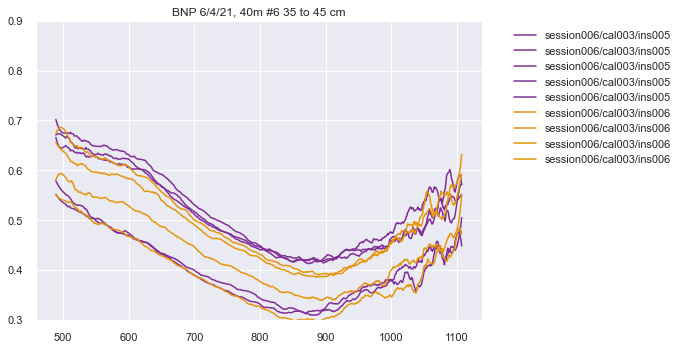

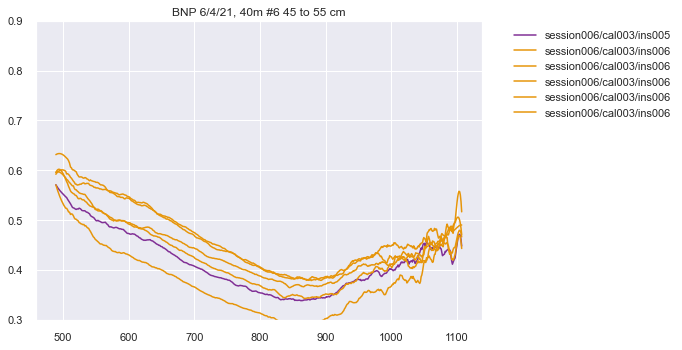

No handles with labels found to put in legend.


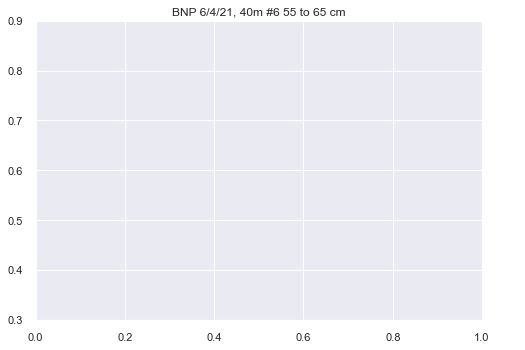

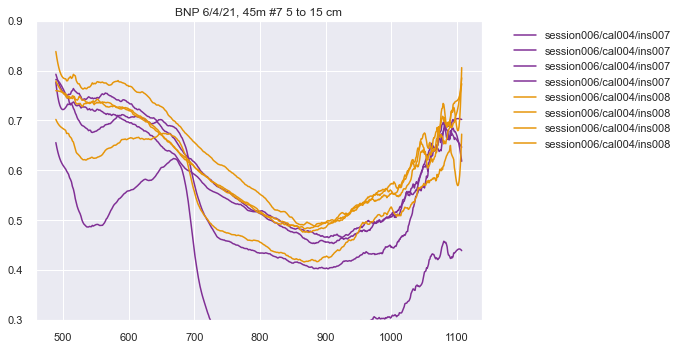

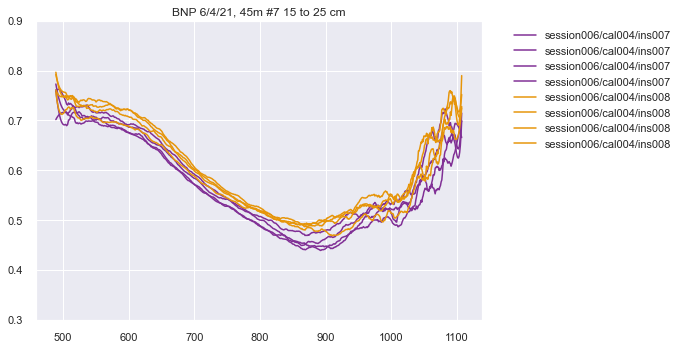

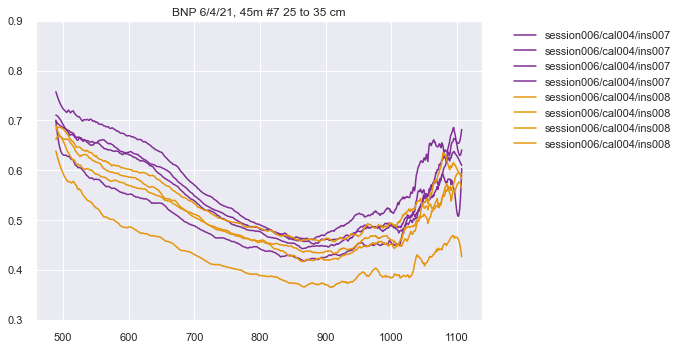

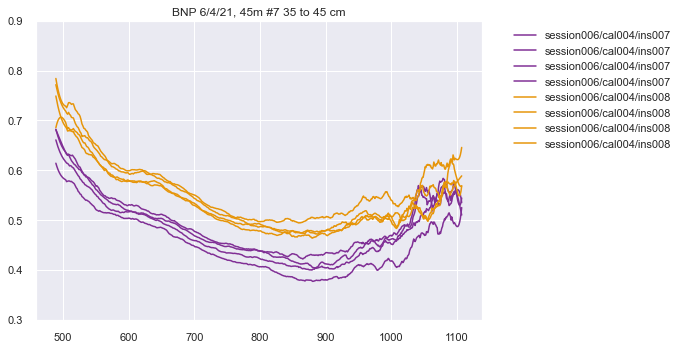

...

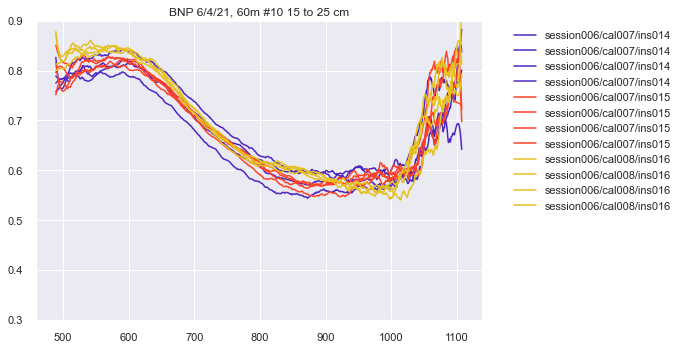

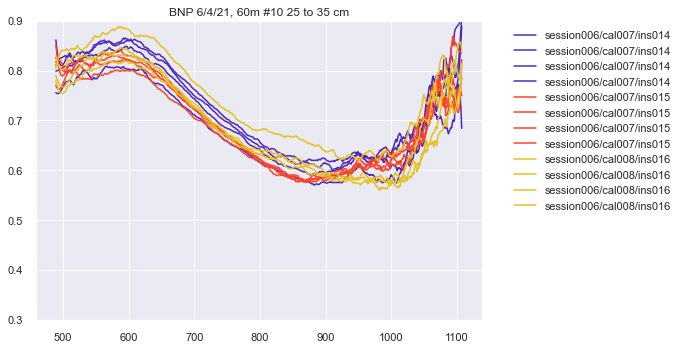

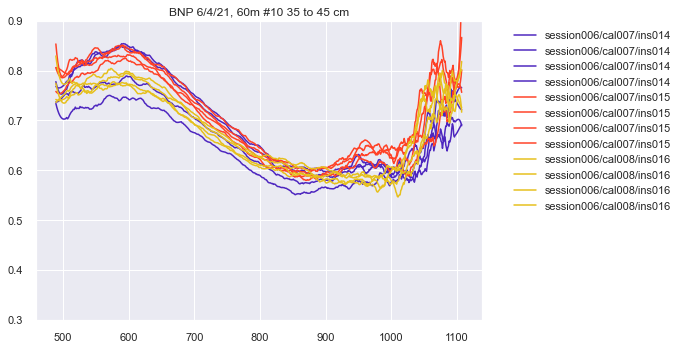

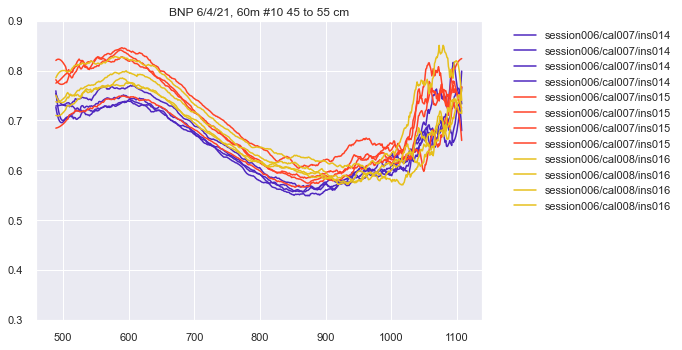

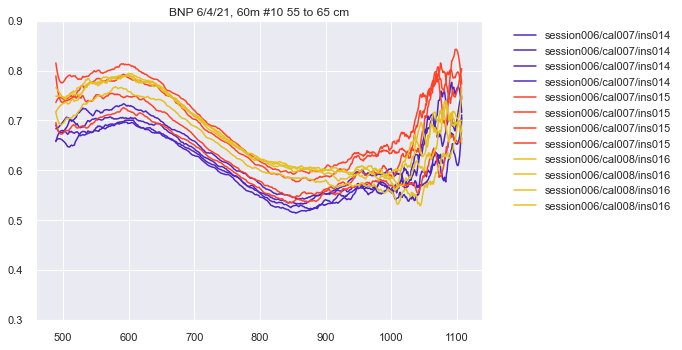

In [10]:
conditions = bath_df['target'].unique()
for condition in conditions:
    for depth in range(5, 60, 10):

        t1 = bath_df.loc[bath_df['target'] == condition]

        unique_insertions = t1['insertion'].unique()
        rgb_values = sns.color_palette("CMRmap", unique_insertions.shape[0])
        color_map = dict(zip(unique_insertions, rgb_values))

        path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
        file_name = bath_df.iat[0, 0]
        file = path_name + file_name
        depth_min = depth
        depth_max = depth + 10

        fig, ax = plt.subplots()
        ax.set_ylim(0.3, 0.9)
        ax.set_title(f"BNP {date}, {condition} {depth_min} to {depth_max} cm")


        for index in t1.index.values:
            session = bath_df['session'][index]
            calibration = bath_df['calibration'][index]
            insertion = bath_df['insertion'][index]
            cal_path = f'{session}/{calibration}'
            with h5py.File(file, 'r') as h5_file:
                absorbance_depths = h5_file[f'{session}/{calibration}/{insertion}/derived/absorbance_depth'][:]
            waves = get_visible_wavelength_vector(file, cal_path)

            absorbances = absorbance_depths[:, :512]
            depths = absorbance_depths[:, -1]
            absorbances_no_surface = absorbances[(depths > depth_min) & (depths < depth_max)]
            depths_no_surface = depths[(depths > depth_min) & (depths < depth_max)]

            for i in range(absorbances_no_surface.shape[0]):
                color = color_map[insertion]
                ax.plot(waves,
                        savgol_filter(absorbances_no_surface[i, :], 21, 3),
                        color=color, label=f'{session}/{calibration}/{insertion}')
        plt.legend(bbox_to_anchor=(1.05, 0.8, 0.3, 0.2), loc='upper left')

        plt.show()
        plt.close()